Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3017 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 2862 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 2952 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3217 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3351 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3475 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3331 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 4011 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3368 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3589 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3544 seconds.


<ipython-input-1-10378e6fa3d6>:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(figsize=(12, 8))
Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3436 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3431 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3668 seconds.


Only 200 samples in chain.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (4 chains in 1 job)
NUTS: [alpha, seed, log_r_t]


Sampling 4 chains for 700 tune and 200 draw iterations (2_800 + 800 draws total) took 3708 seconds.


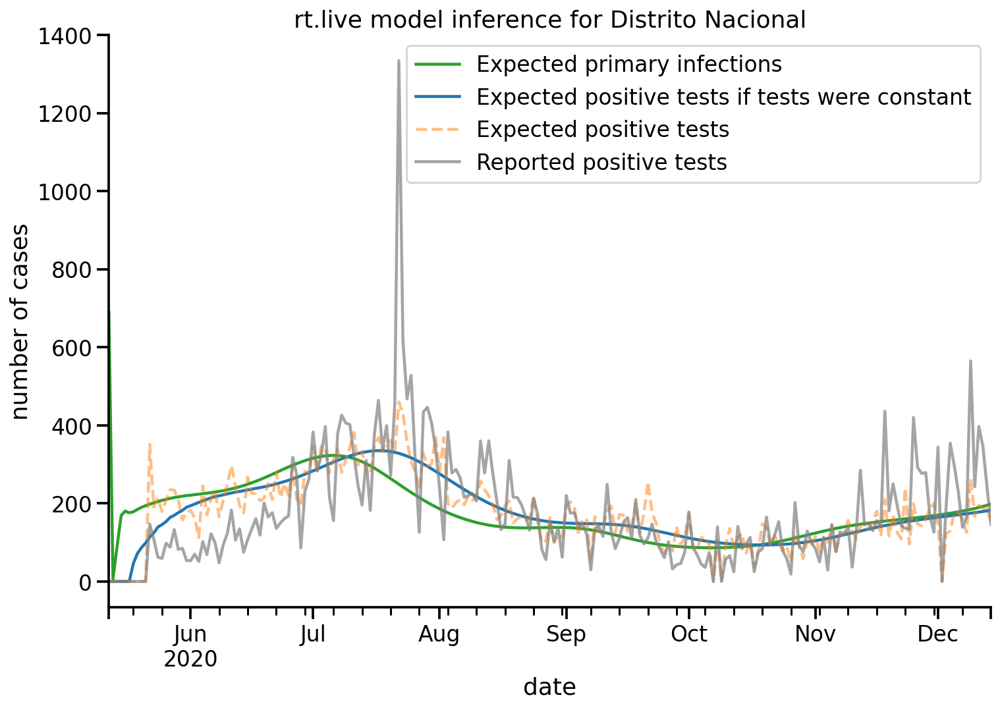

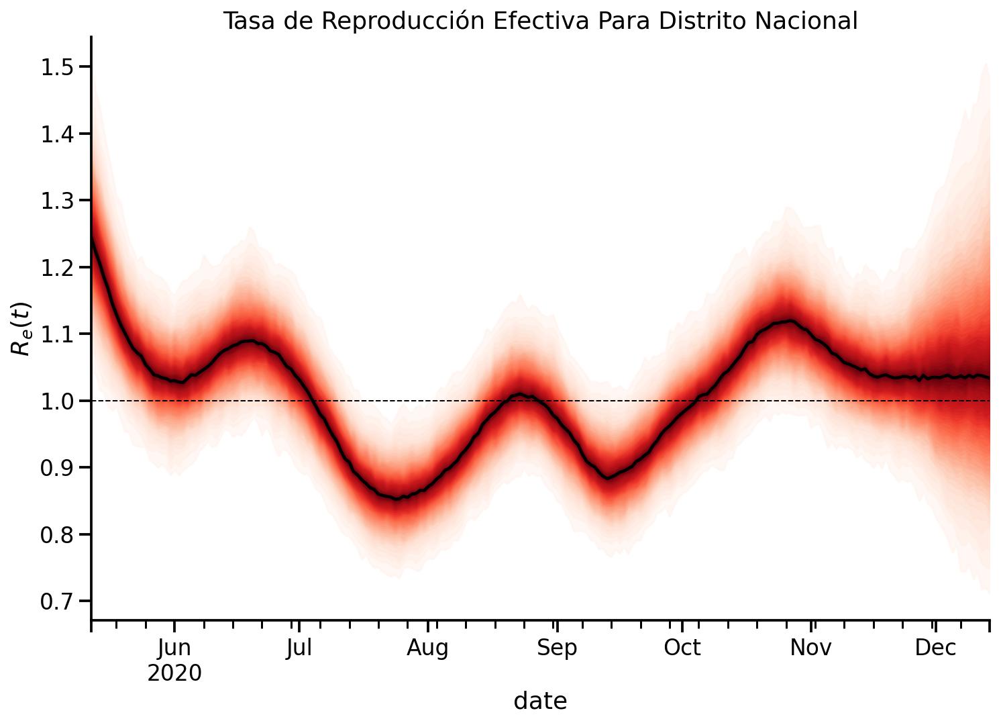

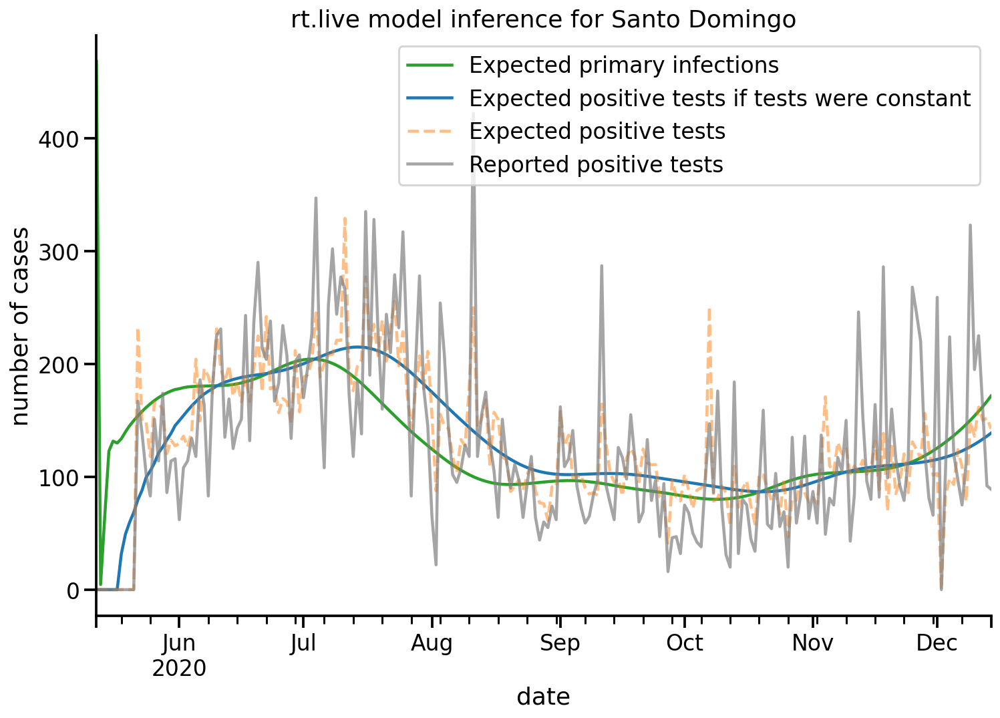

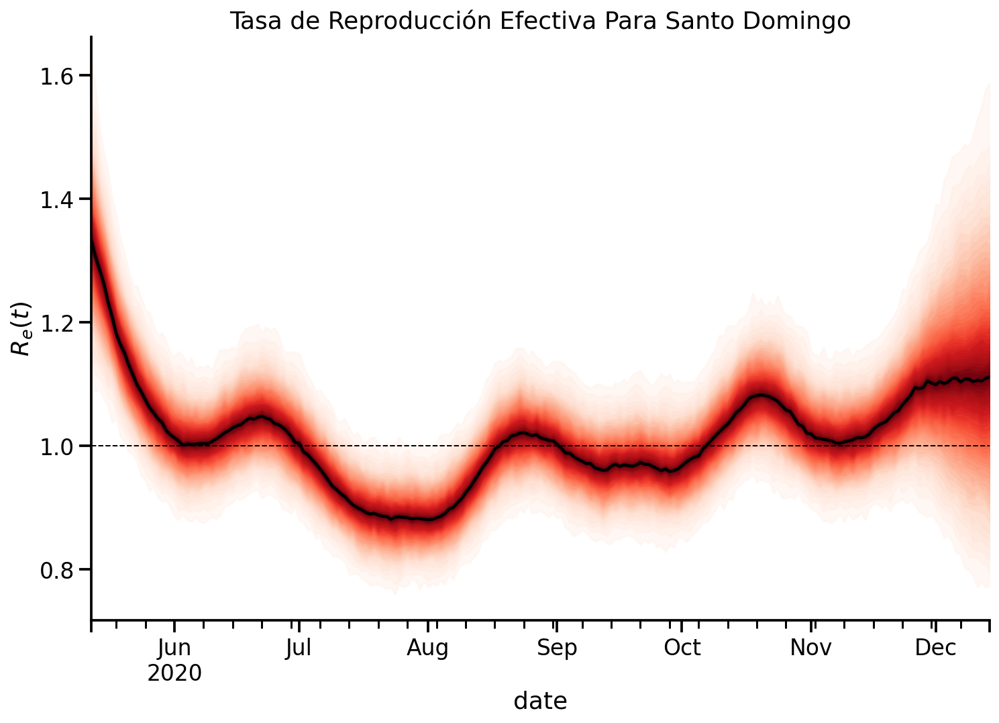

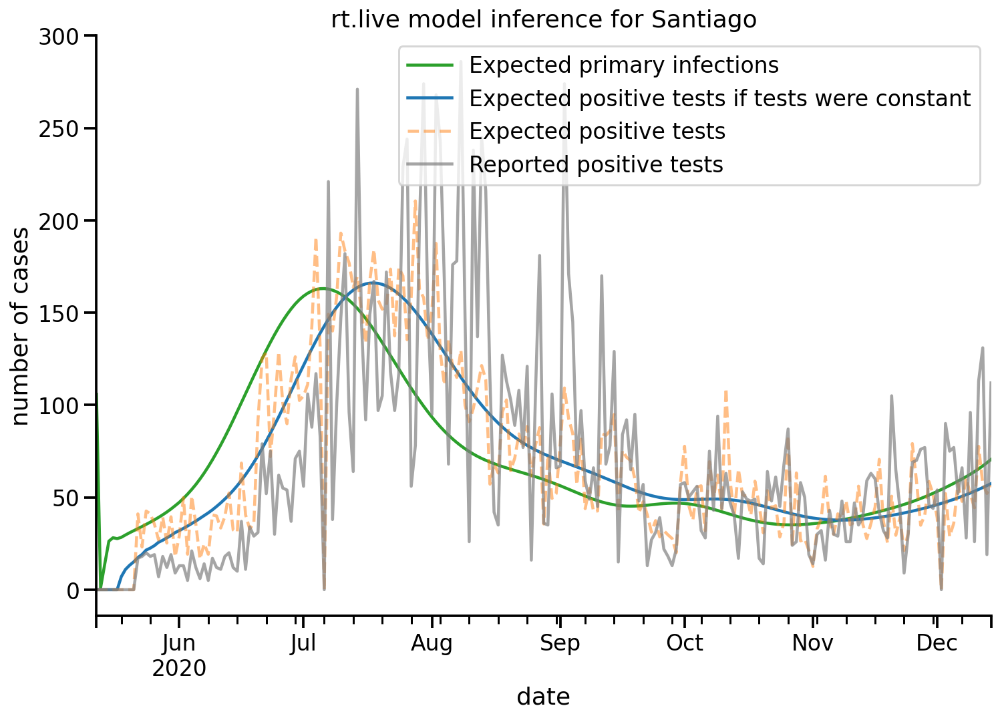

...

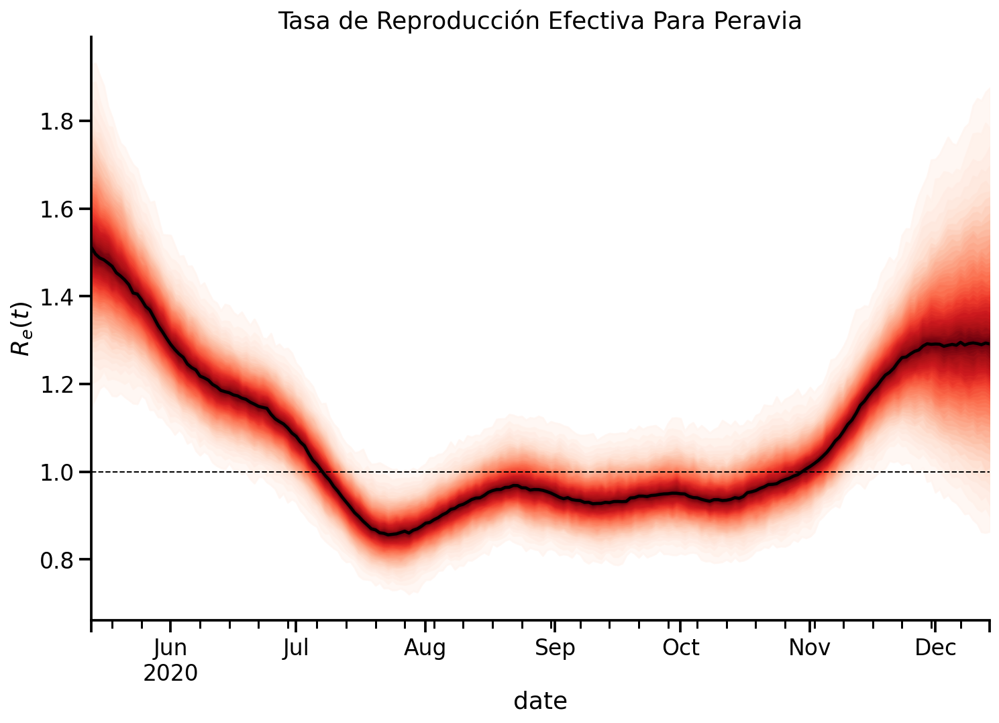

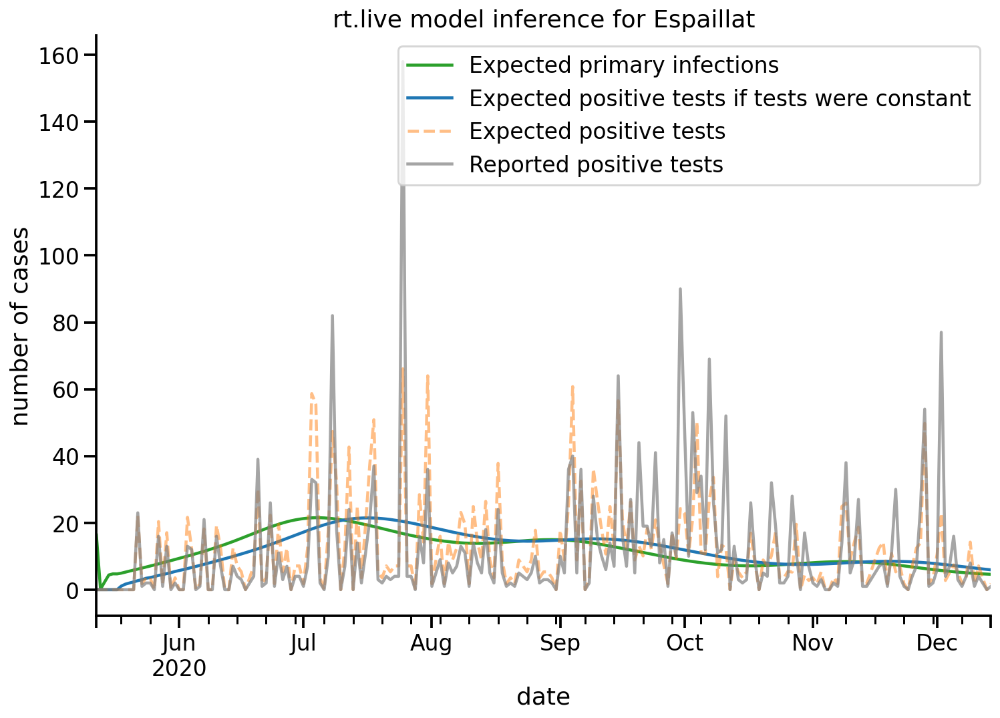

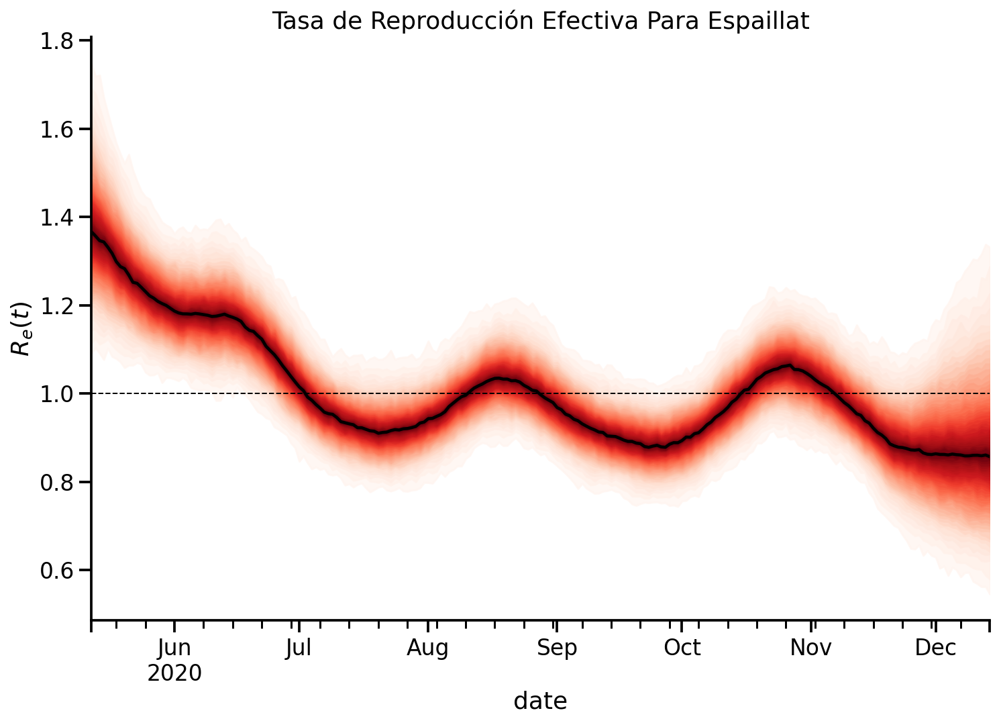

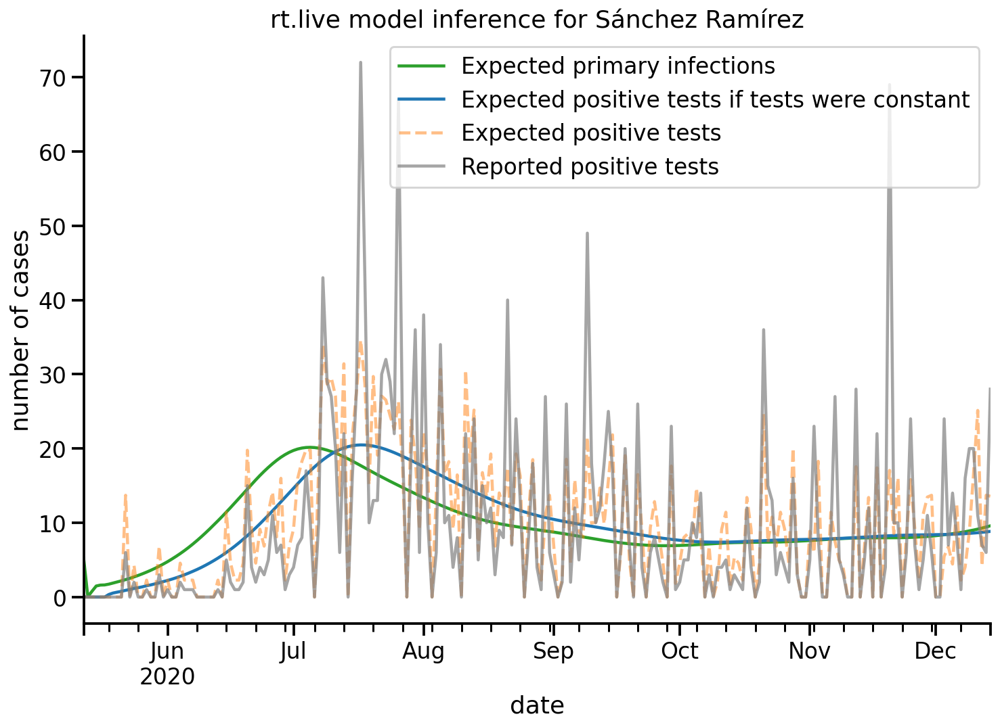

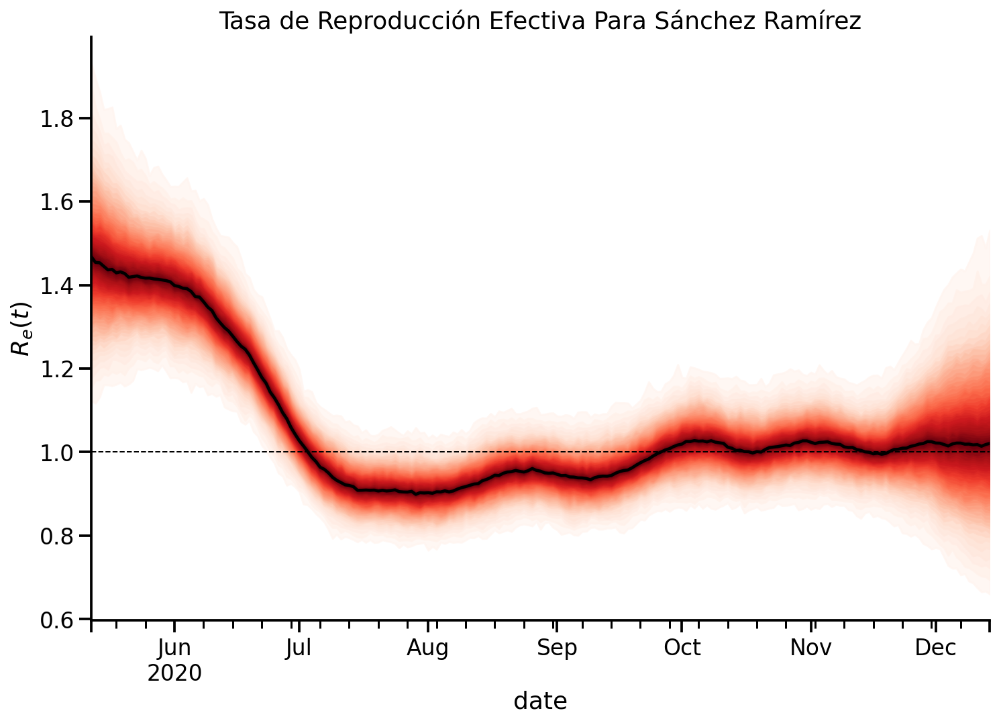

In [1]:
# -*- coding: utf-8 -*-
"""
Created on Mon Sep 21 14:32:05 2020

@author: Georges Bournigal based on rt.live
"""

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pymc3 as pm
import pandas as pd
import numpy as np
import seaborn as sns
sns.set_context('talk')
from scipy import stats
from matplotlib import pyplot as plt
from covid.models.generative import GenerativeModel
from covid.patients import get_delay_distribution
from covid.data_rd import get_and_process_covidtracking_data
from covid.data import summarize_inference_data
import os
import glob
%config InlineBackend.figure_format = 'retina'

""" Modelo para las 15 provincias con más pruebas procesadas"""
""" Distrito Nacional"""
df = get_and_process_covidtracking_data(
    run_date=pd.Timestamp.today())

regiones= ["Distrito Nacional","Santo Domingo","Santiago","La Vega", "La Altagracia","Duarte",
          "San Cristóbal","La Romana","Puerto Plata","San Pedro de Macorís","San Juan",
           "Azua","Peravia","Espaillat","Sánchez Ramírez"]
           
for i in regiones: 
    region=i
    
    model_data = df.loc[region] 
    gm = GenerativeModel(region, model_data)
    gm.sample()
    result = summarize_inference_data(gm.inference_data)

    fig, ax = plt.subplots(figsize=(12, 8))
    result.infections.plot(c="C2", label="Expected primary infections")
    result.test_adjusted_positive.plot(c="C0", label="Expected positive tests if tests were constant")
    result.test_adjusted_positive_raw.plot(c="C1", alpha=.5, label="Expected positive tests", style="--")
    gm.observed.positive.plot(c="C7", alpha=.7, label="Reported positive tests")
    fig.set_facecolor("w")
    ax.legend();
    ax.set(title=f"rt.live model inference for {region}", ylabel="number of cases")
    sns.despine();
    
    fig, ax = plt.subplots(figsize=(12, 8))
     
    ax.set(title=f"Tasa de Reproducción Efectiva Para {region}", ylabel="$R_e(t)$")
    samples = gm.trace["r_t"]
    x = result.index
    cmap = plt.get_cmap("Reds")
    percs = np.linspace(51, 99, 40)
    colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))
    samples = samples.T
    
    result["median"].plot(c="k", ls='-')
    
    for i, p in enumerate(percs[::-1]):
        upper = np.percentile(samples, p, axis=1)
        lower = np.percentile(samples, 100-p, axis=1)
        color_val = colors[i]
        ax.fill_between(x, upper, lower, color=cmap(color_val), alpha=.8)
    
    ax.axhline(1.0, c="k", lw=1, linestyle="--")
    sns.despine();
    
    result['region'] = region 
    result.to_csv(r'D:\Users\Georg\Documents\GitHub\covid-model\results\result_' + region + '.csv')

#Uniendo todos los resultados
os.chdir(r'D:\Users\Georg\Documents\GitHub\covid-model\results')
extension = 'csv'
all_filenames = [i for i in glob.glob('*.{}'.format(extension))]
#combine all files in the list
result_master = pd.concat([pd.read_csv(f) for f in all_filenames ])
#export to csv
result_master.to_csv( "result_master.csv", index=False, encoding='utf-8-sig')
result_master.to_excel ("result_master.xlsx", index = False, header=True,  encoding='utf-8-sig')